In [1]:
import geopandas as gpd
import math
import matplotlib.pyplot as plt
import pandas as pd

import warnings
warnings.filterwarnings('ignore')

In [2]:
CRS = 'EPSG:2263'

In [3]:
cbg_gdf = gpd.read_file('./data/nyc_cbgs.geojson')
cbg_gdf = cbg_gdf.to_crs(CRS)
cbg_gdf = cbg_gdf.rename(columns={
    'CensusBlockGroup': 'cbg',
})
cbg_gdf['cbg'] = cbg_gdf['cbg'].astype(int)
cbg_gdf = cbg_gdf[['cbg', 'geometry']]

cbg_df = pd.read_csv('./data/cbg_attr_and_cluster_1021.csv')
cbg_df = cbg_df.rename(columns={
    'census_block_group': 'cbg',
    'Cluster': 'cluster',
    'Total Population': 'population',
})
cbg_df = cbg_df[['cbg', 'cluster', 'population']]
cbg_df['cluster'] = cbg_df['cluster'].astype('category')

cbg_gdf = cbg_gdf.merge(cbg_df, how='inner', on=['cbg'])

In [4]:
poi_weekly_df = pd.read_csv('./data/weekly_and_core_with_area.csv')
poi_weekly_df.head()

,placekey,parent_placekey,safegraph_brand_ids,date_range_start,date_range_end,raw_visit_counts,raw_visitor_counts,visits_by_day,visits_by_each_hour,poi_cbg,...,open_hours,category_tags,opened_on,closed_on,tracking_opened_since,tracking_closed_since,category,date,safegraph_place_id,area_square_feet
0,222-222@627-s94-nwk,NaN,NaN,2020-12-21 05:00:00+00:00,2020-12-28T00:00:00-05:00,39,24,"[7,9,6,5,3,5,4]","[0,0,0,0,0,0,0,0,0,0,1,0,0,1,1,4,0,0,0,0,0,0,0...",360470395002,...,"{ ""Mon"": [[""8:00"", ""19:00""]], ""Tue"": [[""8:00"",...",NaN,NaN,NaN,NaN,2019-07,Supermarkets and Specialty Food Stores,2020-12-21,sg:bbe025bf97774f46b165507367517013,3177.0
1,222-222@627-s94-nwk,NaN,NaN,2021-01-11 05:00:00+00:00,2021-01-18T00:00:00-05:00,41,27,"[3,5,7,4,6,13,3]","[0,0,0,0,0,0,0,0,0,0,0,2,0,0,1,0,0,0,0,0,0,0,0...",360470395002,...,"{ ""Mon"": [[""8:00"", ""19:00""]], ""Tue"": [[""8:00"",...",NaN,NaN,NaN,NaN,2019-07,Supermarkets and Specialty Food Stores,2021-01-11,sg:bbe025bf97774f46b165507367517013,3177.0
2,222-222@627-s94-nwk,NaN,NaN,2021-01-18 05:00:00+00:00,2021-01-25T00:00:00-05:00,39,21,"[3,6,7,6,7,8,2]","[0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,2,0,0,0,0,1...",360470395002,...,"{ ""Mon"": [[""8:00"", ""19:00""]], ""Tue"": [[""8:00"",...",NaN,NaN,NaN,NaN,2019-07,Supermarkets and Specialty Food Stores,2021-01-18,sg:bbe025bf97774f46b165507367517013,3177.0
3,222-222@627-s94-nwk,NaN,NaN,2021-01-25 05:00:00+00:00,2021-02-01T00:00:00-05:00,45,24,"[6,5,7,8,5,6,8]","[0,0,0,0,0,0,0,0,0,0,2,0,0,0,1,1,0,1,0,1,0,0,0...",360470395002,...,"{ ""Mon"": [[""8:00"", ""19:00""]], ""Tue"": [[""8:00"",...",NaN,NaN,NaN,NaN,2019-07,Supermarkets and Specialty Food Stores,2021-01-25,sg:bbe025bf97774f46b165507367517013,3177.0
4,222-222@627-s94-nwk,NaN,NaN,2019-01-07 05:00:00+00:00,2019-01-14T00:00:00-05:00,75,40,"[4,6,14,24,8,10,9]","[0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,2,0,2,0,0,0...",360470395002,...,"{ ""Mon"": [[""8:00"", ""19:00""]], ""Tue"": [[""8:00"",...",NaN,NaN,NaN,NaN,2019-07,Supermarkets and Specialty Food Stores,2019-01-07,sg:bbe025bf97774f46b165507367517013,3177.0


In [5]:
poi_weekly_df.columns

Index(['placekey', 'parent_placekey', 'safegraph_brand_ids',
       'date_range_start', 'date_range_end', 'raw_visit_counts',
       'raw_visitor_counts', 'visits_by_day', 'visits_by_each_hour', 'poi_cbg',
       'visitor_home_cbgs', 'visitor_daytime_cbgs',
       'visitor_country_of_origin', 'distance_from_home', 'median_dwell',
       'bucketed_dwell_times', 'related_same_day_brand',
       'related_same_week_brand', 'location_name', 'brands', 'top_category',
       'sub_category', 'naics_code', 'latitude', 'longitude', 'street_address',
       'city', 'region', 'postal_code', 'iso_country_code', 'open_hours',
       'category_tags', 'opened_on', 'closed_on', 'tracking_opened_since',
       'tracking_closed_since', 'category', 'date', 'safegraph_place_id',
       'area_square_feet'],
      dtype='object')

In [6]:
poi_df = poi_weekly_df.groupby(by=['placekey']).agg({
    'poi_cbg': 'last',
    'naics_code': 'last',
    'category': 'last',
    'sub_category': 'last',
    'location_name': 'last',
    'area_square_feet': 'last',
    'latitude': 'last',
    'longitude': 'last',
}).reset_index()
poi_df = poi_df.rename(columns={'poi_cbg': 'cbg'})
poi_df = poi_df.sort_values(by=['naics_code'])
poi_df.to_csv('./exports/poi.csv', index=False)
poi_df.head()

,placekey,cbg,naics_code,category,sub_category,location_name,area_square_feet,latitude,longitude
5480,226-222@627-s4n-pqf,360610158022,311811,Supermarkets and Specialty Food Stores,Retail Bakeries,Unna Bakery,NaN,40.787027,-73.950435
5345,225-225@627-s99-9xq,360810849002,311811,Supermarkets and Specialty Food Stores,Retail Bakeries,Fay Da Bakery,24759.0,40.756244,-73.829009
5349,225-225@627-vsw-7nq,360850146071,311811,Supermarkets and Specialty Food Stores,Retail Bakeries,Amici Bakery,16166.0,40.559894,-74.166016
9721,22b-222@627-s7s-jqf,360810475001,311811,Supermarkets and Specialty Food Stores,Retail Bakeries,Sunrise Bakery & Cafe,732.0,40.736802,-73.879306
27393,23h-222@627-s9z-n3q,360810779071,311811,Supermarkets and Specialty Food Stores,Retail Bakeries,Avraham Bakery,12069.0,40.724409,-73.820241


In [7]:
poi_gdf = gpd.GeoDataFrame(poi_df, geometry=gpd.points_from_xy(poi_df['longitude'], poi_df['latitude']), crs='EPSG:4326')
poi_gdf = poi_gdf.to_crs(CRS)

In [8]:
def plot_locations(gdf, attr, SIZE=10):
    attrs = list(set(gdf[attr]))
    n_attr = len(attrs)
    fig, ax = plt.subplots(n_attr, 1, figsize=(SIZE, SIZE * n_attr))
    for i, attr_value in enumerate(attrs):
        cbg_gdf.plot(ax=ax[i], color='#eee')
        poi_gdf[poi_gdf[attr] == attr_value].plot(ax=ax[i], color=f'C{i % 6}', markersize=1, alpha=0.5)
        ax[i].set_title(attr_value)
    plt.tight_layout()
    plt.show()

In [9]:
categories = list(set(poi_gdf['category']))
categories.sort()

In [10]:
join_gdf = cbg_gdf.merge(poi_gdf.drop(columns=['geometry']), on='cbg', how='left')

In [11]:
poi_pivot_gdf = poi_df[['cbg', 'placekey', 'category']]
poi_pivot_gdf = poi_pivot_gdf.groupby(by=['cbg', 'category']).count().reset_index()
poi_pivot_gdf = poi_pivot_gdf.pivot(index='cbg', columns=['category'], values='placekey').reset_index()
poi_pivot_gdf = poi_pivot_gdf.fillna(0)
poi_pivot_gdf = poi_pivot_gdf.iloc[:, :].astype(int)
poi_pivot_gdf.head()

category,cbg,Community and Special Food Services,Food (Health) Supplement Stores,General Merchandise and Convenience Stores,Restaurants and Other Eating Places,Supermarkets and Specialty Food Stores,Tobacco and Liquor Stores
0,360050002001,0,0,1,0,0,0
1,360050002002,0,0,0,0,0,1
2,360050004001,0,0,0,1,1,0
3,360050004002,0,0,0,2,1,2
4,360050004003,0,0,0,0,1,0


In [12]:
join_gdf = cbg_gdf.merge(poi_pivot_gdf, on='cbg', how='left')
join_gdf = join_gdf.fillna(0)

poi_area_gdf = join_gdf
# Divide counts by CBG Area
for i in range(4, 10):
    poi_area_gdf.iloc[:, i] = poi_area_gdf.iloc[:, i] / (poi_area_gdf['geometry'].geometry.area * 1000)

poi_population_gdf = join_gdf
# Divide counts by Population
for i in range(4, 10):
    poi_population_gdf.iloc[:, i] = poi_population_gdf.iloc[:, i] / (poi_population_gdf['population'])
poi_population_gdf.head()

,cbg,geometry,cluster,population,Community and Special Food Services,Food (Health) Supplement Stores,General Merchandise and Convenience Stores,Restaurants and Other Eating Places,Supermarkets and Specialty Food Stores,Tobacco and Liquor Stores
0,360050175002,"MULTIPOLYGON (((1007579.278 241875.151, 100781...",2,656,0.0,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.0
1,360050141001,"MULTIPOLYGON (((1007327.986 239855.027, 100751...",2,1228,0.0,0.000000e+00,0.000000e+00,1.352587e-12,0.000000e+00,0.0
2,360050145001,"MULTIPOLYGON (((1010307.431 242068.478, 101052...",2,2716,0.0,7.273949e-13,0.000000e+00,1.454790e-12,7.273949e-13,0.0
3,360050075002,"MULTIPOLYGON (((1009064.051 238018.664, 100909...",2,3488,0.0,0.000000e+00,2.442312e-13,0.000000e+00,0.000000e+00,0.0
4,360050418001,"MULTIPOLYGON (((1022160.816 265436.445, 102254...",0,657,0.0,1.004371e-12,0.000000e+00,4.017485e-12,1.004371e-12,0.0


In [13]:
def plot_choropleths(gdf, attrs, title_suffix, SIZE=10):
    n_attrs = len(attrs)
    fig, ax = plt.subplots(n_attrs, 1, figsize=(SIZE, SIZE * n_attrs))
    cmaps = ['Blues', 'Oranges', 'Greens', 'Reds', 'Purples', 'Greys']
    for i, attr in enumerate(attrs):
        try:
            gdf.plot(ax=ax[i], column=attr, cmap=cmaps[i % 6], scheme='FisherJenksSampled', legend=True, edgecolor='#999', linewidth=0.1)
            ax[i].set_title(f'{attr} {title_suffix}')
        except:
            print(f'Error with {attr}')
    plt.tight_layout()
    plt.show()

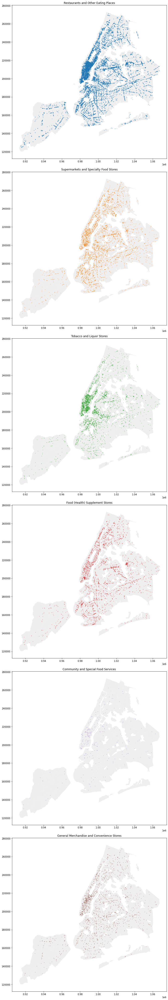

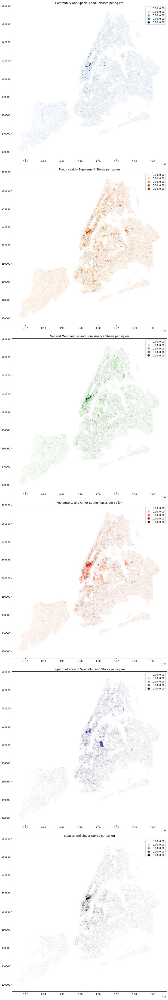

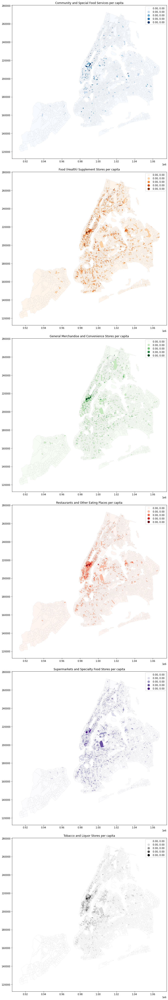

In [14]:
plot_locations(poi_gdf, 'category')
plot_choropleths(poi_area_gdf, categories, 'per sq km')
plot_choropleths(poi_population_gdf, categories, 'per capita')

# Sub-Categories

In [15]:
sub_categories = list(set(poi_gdf['sub_category']))
sub_categories.sort()

In [16]:
poi_pivot_sc_gdf = poi_df[['cbg', 'placekey', 'sub_category']]
poi_pivot_sc_gdf = poi_pivot_sc_gdf.groupby(by=['cbg', 'sub_category']).count().reset_index()
poi_pivot_sc_gdf = poi_pivot_sc_gdf.pivot(index='cbg', columns=['sub_category'], values='placekey').reset_index()
poi_pivot_sc_gdf = poi_pivot_sc_gdf.fillna(0)
poi_pivot_sc_gdf = poi_pivot_sc_gdf.iloc[:, :].astype(int)
poi_pivot_sc_gdf.head()

sub_category,cbg,All Other General Merchandise Stores,All Other Miscellaneous Store Retailers (except Tobacco Stores),All Other Specialty Food Stores,Baked Goods Stores,"Beer, Wine, and Liquor Stores",Caterers,Community Food Services,Confectionery and Nut Stores,Convenience Stores,...,Food (Health) Supplement Stores,Fruit and Vegetable Markets,Full-Service Restaurants,Limited-Service Restaurants,Meat Markets,Pharmacies and Drug Stores,Retail Bakeries,Snack and Nonalcoholic Beverage Bars,Supermarkets and Other Grocery (except Convenience) Stores,Tobacco Stores
0,360050002001,1,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,360050002002,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
2,360050004001,0,0,0,0,0,0,0,0,0,...,0,0,1,0,0,0,0,0,1,0
3,360050004002,0,0,0,0,1,0,0,0,0,...,0,0,2,0,0,0,0,0,1,0
4,360050004003,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,1,0


In [17]:
join_sc_gdf = cbg_gdf.merge(poi_pivot_sc_gdf, on='cbg', how='left')
join_sc_gdf = join_sc_gdf.fillna(0)

poi_area_sc_gdf = join_sc_gdf
# Divide counts by CBG Area
for i in range(4, len(poi_area_sc_gdf.columns)):
    poi_area_sc_gdf.iloc[:, i] = poi_area_sc_gdf.iloc[:, i] / (poi_area_sc_gdf['geometry'].geometry.area * 1000)
    
poi_population_sc_gdf = join_sc_gdf
# Divide counts by Population
for i in range(4, len(poi_area_sc_gdf.columns)):
    poi_population_sc_gdf.iloc[:, i] = poi_population_sc_gdf.iloc[:, i] / (poi_population_sc_gdf['population'])

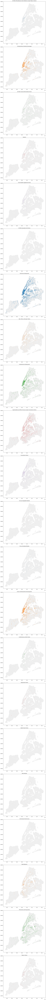

Error with Baked Goods Stores
Error with Community Food Services


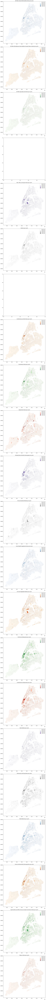

Error with Baked Goods Stores
Error with Community Food Services


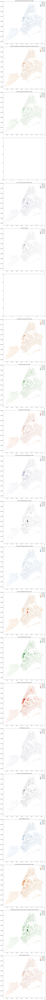

In [18]:
plot_locations(poi_gdf, 'sub_category')
plot_choropleths(poi_area_sc_gdf, sub_categories, 'per sq km')
plot_choropleths(poi_population_sc_gdf, sub_categories, 'per capita')